In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import rcParams
import numpy as np
from scipy import signal
from sklearn.preprocessing import LabelEncoder
import mne


# definições de filtros
def butter_bandpass(data, lowcut, highcut, fs=512, order=4):
    nyq = fs * 0.5
    low = lowcut / nyq
    high = highcut / nyq
    b, a = signal.butter(order, [low, high], btype='bandpass')
    return signal.filtfilt(b, a, data)


def butter_lowpass(data, lowcut, fs=512, order=4):
    nyq = fs * 0.5
    low = lowcut / nyq
    b, a = signal.butter(order, low, btype='lowpass')
    return signal.filtfilt(b, a, data)


def butter_highpass(data, highcut, fs=512, order=4):
    nyq = fs * 0.5
    high = highcut / nyq
    b, a = signal.butter(order, high, btype='highpass')
    return signal.filtfilt(b, a, data)


def butter_notch(data, cutoff, var=1, fs=512, order=4):
    nyq = fs * 0.5
    low = (cutoff - var) / nyq
    high = (cutoff + var) / nyq
    b, a = signal.iirfilter(order, [low, high], btype='bandstop', ftype="butter")
    return signal.filtfilt(b, a, data)

In [2]:
def print_graphs(data):
    for i in range(0, 21, 3):
        plt.plot(data[i,:])
    plt.title('Domínio do tempo')
    plt.show()

    for i in range(0, 21, 3):
        plt.psd(data[i,:], Fs=512)
    plt.title('Domínio da frequência')
    plt.show()

    for i in range(0, 21, 3):
        plt.specgram(data[i,:], Fs=512)
    plt.title('Domínio da frequência')
    plt.show()

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from utils import print_graphs
from sklearn.preprocessing import LabelEncoder

dataset1 = np.load("../../datasets/beta/data1.npy")
dataset2 = np.load("../../datasets/beta/data2.npy")
print(dataset1)
print(dataset1.shape)

labels1 = np.load("../../datasets/beta/labels1.npy")
labels2 = np.load("../../datasets/beta/labels2.npy")
print(labels1)
print(labels1.shape)

def print_graphs(data1, data2, FS=250):
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 10))

    # Plot time domain for dataset1
    for i in range(data1.shape[0]):
        axes[0, 0].plot(data1[i, :])
    axes[0, 0].set_title('Time Domain - Dataset 1')

    # Plot time domain for dataset2
    for i in range(data2.shape[0]):
        axes[0, 1].plot(data2[i, :])
    axes[0, 1].set_title('Time Domain - Dataset 2')

    # Plot frequency domain for dataset1
    for i in range(data1.shape[0]):
        axes[1, 0].psd(data1[i, :], Fs=FS)
    axes[1, 0].set_title('Frequency Domain - Dataset 1')

    # Plot frequency domain for dataset2
    for i in range(data2.shape[0]):
        axes[1, 1].psd(data2[i, :], Fs=FS)
    axes[1, 1].set_title('Frequency Domain - Dataset 2')

    # Plot spectrogram for dataset1
    for i in range(data1.shape[0]):
        axes[2, 0].specgram(data1[i, :], Fs=FS)
    axes[2, 0].set_title('Spectrogram - Dataset 1')

    # Plot spectrogram for dataset2
    for i in range(data2.shape[0]):
        axes[2, 1].specgram(data2[i, :], Fs=FS)
    axes[2, 1].set_title('Spectrogram - Dataset 2')

    plt.tight_layout()
    plt.show()


print_graphs(dataset1, dataset2)

[[[-10.9838121   -9.94227301  -9.59060118 ...  14.54616334  16.26127338
    16.29279921]
  [-11.76942072 -11.87053725 -11.92255873 ...  12.72374935  16.49178769
    17.70316932]
  [ -9.59508511 -10.19041832 -11.12867898 ...   8.239021     9.83867157
    10.62196184]
  ...
  [  7.69012511   9.90247438   9.35756639 ...  -2.89647451  -2.07715121
    -0.70880535]
  [  5.78827245   8.03286763   8.88133807 ...  -2.80099675  -1.53015902
    -0.69770472]
  [  6.38913721  10.04692542  11.2823454  ...  -3.38385053  -2.1728275
     0.02050338]]

 [[ -5.18734076  -3.05023739  -1.95377422 ...   1.3961835    5.00643333
     4.74412603]
  [ -3.95188858  -2.73091741  -2.18811311 ...  -0.83360118   2.7723218
     5.16033865]
  [ -2.06802829  -0.78108599  -0.74244776 ...  -1.31619711   2.16175366
     3.68243204]
  ...
  [ -6.30691455  -4.38235946  -2.33221463 ...   3.39168142   3.74131785
     3.61434636]
  [ -3.8489731   -2.50809503  -1.35467952 ...   3.44075198   3.09199593
     3.09111912]
  [ -5.96

/tmp/ipykernel_22549/960088367.py:41: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=64).
  axes[2, 0].specgram(data1[i, :], Fs=FS)
/tmp/ipykernel_22549/960088367.py:46: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=64).
  axes[2, 1].specgram(data2[i, :], Fs=FS)


In [ ]:
import mne

n_channels = 64

sfreq = 250
# ch names geradas
ch_ideal = ["PZ", "PO3", "PO5", "PO4", "PO6", "POZ", "O1", "OZ", "O2"]
ch_names = ["FP1", "FPZ", "FP2", "AF3", "AF4", "F7", "F5", "F3", "F1",
            "FZ", "F2", "F4", "F6", "F8", "FT7", "FC5", "FC3", "FC1", 
            "FCZ", "FC2", "FC4", "FC6", "FT8", "T7", "C5", "C3", "C1", 
            "CZ", "C2", "C4", "C6", "T8", "M1", "TP7", "CP5", "CP3", 
            "CP1", "CPZ", "CP2", "CP4", "CP6", "TP8", "M2", "CB1", 
            "CB2","P7", "P5", "P3", "P1", "PZ", "P2", "P4", "P6", 
            "P8", "PO7", "PO5", "PO3", "POZ", "PO4", "PO6", "PO8", 
            "O1", "OZ", "O2"]
ch_types = ['eeg'] * n_channels
info = mne.create_info(ch_names, sfreq=sfreq, ch_types=ch_types)
info

<Info | 7 non-empty values
 bads: []
 ch_names: FP1, FPZ, FP2, AF3, AF4, F7, F5, F3, F1, FZ, F2, F4, F6, F8, ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: unspecified
 nchan: 64
 projs: []
 sfreq: 250.0 Hz
>

Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Setting up band-pass filter from 7 - 17 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 7.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 6.00 Hz)
- Upper passband edge: 17.00 Hz
- Upper transition bandwidth: 4.25 Hz (-6 dB cutoff frequency: 19.12 Hz)
- Filter length: 413 samples (1.652 s)

Overwriting existing file.
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Setting up band-pass filter from 7 - 17 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple a

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
/tmp/ipykernel_19886/3726025464.py:26: RuntimeWarning: This filename (../beta_epo1.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  filtered_mne_data.save(filename, overwrite=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Par

Overwriting existing file.


[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
/tmp/ipykernel_19886/3726025464.py:26: RuntimeWarning: This filename (../beta_epo2.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  filtered_mne_data.save(filename, overwrite=True)
/tmp/ipykernel_19886/960088367.py:41: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=9).
  axes[2, 0].specgram(data1[i, :], Fs=FS)
/tmp/ipykernel_19886/960088367.py:46: UserWarning: Only one segment is calculated since parameter NFFT (=256) >= signal length (=9).
  axes[2, 1].specgram(data2[i, :], Fs=FS)


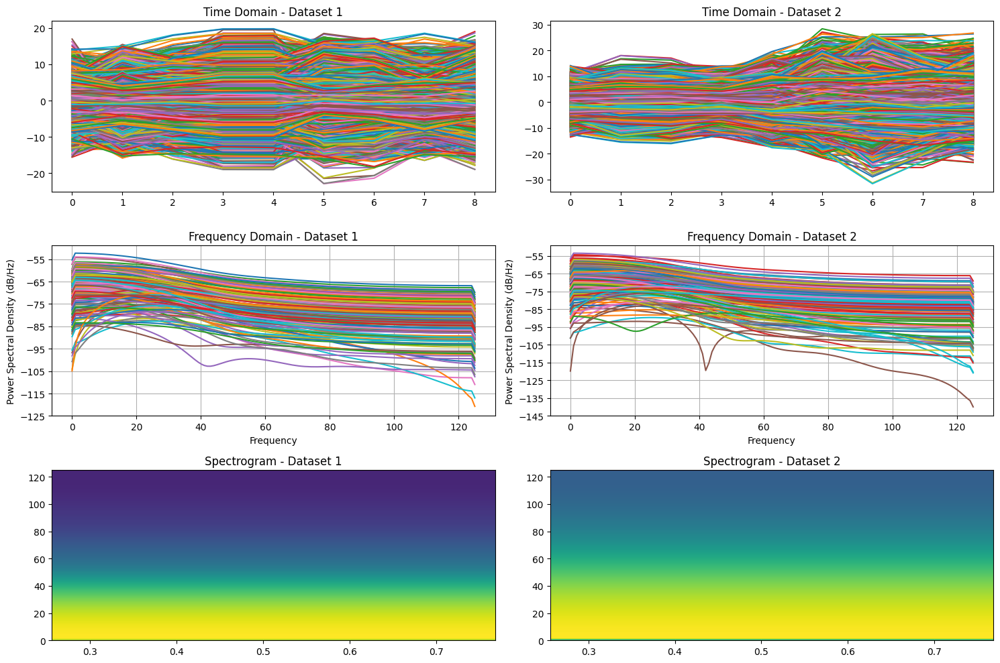

In [ ]:
def create_mne_epochs(data, labels, ch_names, filename=""):
    sfreq=250
    n_channels = len(ch_names)
    ch_types = ['eeg'] * n_channels
    info = mne.create_info(ch_names, sfreq=sfreq, ch_types=ch_types)

    le = LabelEncoder()
    events = np.column_stack((
        np.arange(len(labels)),
        np.zeros(len(labels), dtype=int),
        le.fit_transform(labels)
    ))

    event_dict = {str(value): index for index, value in enumerate(sorted(set(labels)))}

    mne_data = mne.EpochsArray(data, info, events, event_id=event_dict)

    drop_channels = [ch for ch in mne_data.info['ch_names'] if ch not in ch_ideal]

    mne_data = mne_data.drop_channels(drop_channels)

    freq_low=7
    freq_high=17
    filtered_mne_data = mne_data.filter(freq_low, freq_high)
    
    filtered_mne_data.save(filename, overwrite=True)

    return mne_data



mne_data1 = create_mne_epochs(dataset1, labels1, ch_names, "../beta_epo1.fif")
mne_data2 = create_mne_epochs(dataset2, labels2, ch_names,"../beta_epo2.fif")
#convert mnes to np and plot
mne_data1_np = mne_data1.get_data()
mne_data2_np = mne_data2.get_data()

print_graphs(mne_data1_np, mne_data2_np)

In [ ]:
def plot_psd(mne_data, ncols=8):
    n_epochs = len(mne_data)
    nrows = (n_epochs + ncols - 1) // ncols  

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3 * nrows))

    for i, ax in enumerate(axes.flatten()):
        if i < n_epochs:
            epoch = mne_data[i]
            view = epoch.compute_psd(method='welch', fmin=7, fmax=17, verbose=False)
            view.plot(show=False, axes=ax)
            ax.set_title(f'Epoch {i+1}')
            ax.axvline(x=float(list(epoch.event_id)[0]), linestyle='--', color='green')

    plt.tight_layout()
    plt.show()

### Epochs Dataset 3

/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  vi

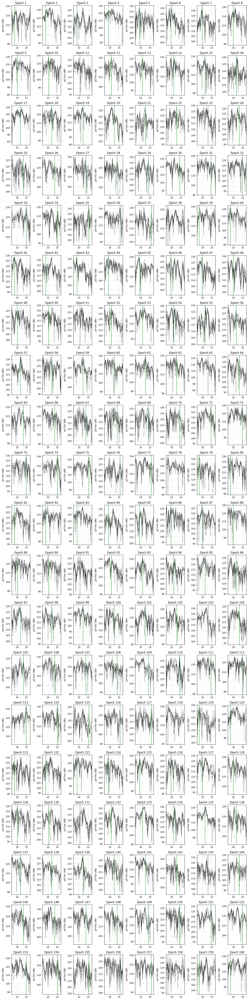

In [ ]:
plot_psd(mne_data1)

### Epochs Dataset 4

/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  view.plot(show=False, axes=ax)
/tmp/ipykernel_19886/1057291774.py:11: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  vi

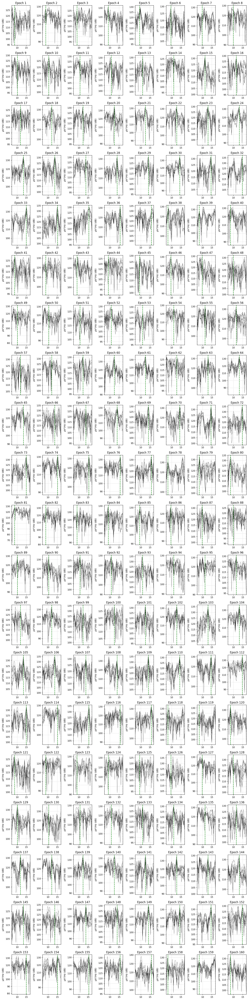

In [ ]:
plot_psd(mne_data2)